extends ["interpreting gpt: the logit lens"](https://www.lesswrong.com/posts/AcKRB8wDpdaN6v6ru/interpreting-gpt-the-logit-lens) with logit lens plots for other autoregressive LMs, like the **GPT-Neo** models from [EleutherAI](eleuther.ai).

models covered:

- **small models**
  - gpt2 125M
  - gpt-neo 125M
- **"gpt2-scale" models**
  - gpt2 1.5B
  - gpt-neo 1.3B
  - CTRL
- **larger models**
  - gpt-neo 2.7B

the original "logit lens" material is also extended here by:

- breaking down transformer blocks into their attn and mlp parts
- exploring different definitions of the "decoder"

----

interestingly, **gpt-neo** models do _not_ display the "logit lens" phenomenon like gpt2 does.

further investigation reveals that we can see similar behavior with gpt-neo **if** we tweak the original "lens" so the _final block_ of the model is counted as part of the "decoder" rather than part of the model.

**CTRL** _does_ display the "logit lens" phenomenon.  unlike gpt2, it not only "looks like the output" in late layers, it also "looks like the input" in early layers.

i don't know why the models differ like this.  i'm pretty sure it's not a bug, or some trivial quirk of how the models are represented in code.  some possibilities:

- different data
- different training schedule (~1 epoch vs many)
- different sized context window?  note CTRL has the smallest window here, neo the biggest

\- nostalgebraist, 5/10/21

CHANGELOG

- 5/11/21: added ctrl
- 5/17/21: updated with subblocks, decoder extensions, new plotting code

## environment setup

the next cell install finetuneanon's branch of `transformers` with modifications from [this PR](https://github.com/huggingface/transformers/pull/11630).

this is a change to the gpt-neo implementation that doesn't affect functionality, but will make some things much easier for us here.

In [ ]:
%pip install git+https://github.com/finetuneanon/transformers/@gpt-neo-localattention

`transformer-utils` is a package i wrote!

see the source at https://github.com/nostalgebraist/transformer-utils/

In [ ]:
%pip install transformer-utils

checks the GPU.

if it isn't a T4, P100, or V100, it's probably too small and you should try again later.

In [ ]:
!nvidia-smi

## code setup

In [ ]:
from transformer_utils.low_memory import enable_low_memory_load

enable_low_memory_load()

In [ ]:
import transformers

tokenizer = transformers.AutoTokenizer.from_pretrained("gpt2")

In [ ]:
import gc

def cleanup_model(model):
    try:
      if hasattr(model, 'base_model_prefix') and len(model.base_model_prefix) > 0:
        bm = getattr(model, model.base_model_prefix)
        del bm
    except:
      pass
    del model

    gc.collect()
    torch.cuda.empty_cache()

## texts

In [ ]:
gpt3_abstract = """Recent work has demonstrated substantial gains on many NLP tasks and benchmarks by pre-training
on a large corpus of text followed by fine-tuning on a specific task. While typically task-agnostic
in architecture, this method still requires task-specific fine-tuning datasets of thousands or tens of
thousands of examples. By contrast, humans can generally perform a new language task from only
a few examples or from simple instructions – something which current NLP systems still largely
struggle to do. Here we show that scaling up language models greatly improves task-agnostic,
few-shot performance, sometimes even reaching competitiveness with prior state-of-the-art finetuning approaches. Specifically, we train GPT-3, an autoregressive language model with 175 billion
parameters, 10x more than any previous non-sparse language model, and test its performance in
the few-shot setting. For all tasks, GPT-3 is applied without any gradient updates or fine-tuning,
with tasks and few-shot demonstrations specified purely via text interaction with the model. GPT-3
achieves strong performance on many NLP datasets, including translation, question-answering, and
cloze tasks, as well as several tasks that require on-the-fly reasoning or domain adaptation, such as
unscrambling words, using a novel word in a sentence, or performing 3-digit arithmetic. At the same
time, we also identify some datasets where GPT-3’s few-shot learning still struggles, as well as some
datasets where GPT-3 faces methodological issues related to training on large web corpora. Finally,
we find that GPT-3 can generate samples of news articles which human evaluators have difficulty
distinguishing from articles written by humans. We discuss broader societal impacts of this finding
and of GPT-3 in general.""".replace("\n", " ")

plasma = """Sometimes, when people say plasma, they mean a state of matter. Other times, when people say plasma"""
plasma_short = """That's my first example of plasma. My second example of"""

plasma_repetitive = """I love plasma. I love plasma. I love plasma. I love plasma."""

seals = """What the fuck did you just fucking say about me, you little bitch? I'll have you know I graduated top of my class in the Navy Seals, and I've been involved in numerous secret raids on Al-Quaeda, and I have over 300 confirmed kills. I am trained in gorilla warfare and I'm the top sniper in the entire US armed forces. You are nothing to me but just another target. I will wipe you the fuck out with"""

In [ ]:
import torch

def text_to_input_ids(text):
    toks = tokenizer.encode(text)
    return torch.as_tensor(toks).view(1, -1).cuda()

In [ ]:
input_ids = text_to_input_ids(gpt3_abstract)

input_ids = input_ids[:, :160]

## Small models

#### gpt2

In [ ]:
model = transformers.AutoModelForCausalLM.from_pretrained('gpt2')

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/lazy.py:175: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


##### probs, ranks, K-L

to warm us up, i'll do a few plots of the same type i did in the [original blog post](https://www.lesswrong.com/posts/AcKRB8wDpdaN6v6ru/interpreting-gpt-the-logit-lens).

below: layer predictions on a segment of the gpt3 abstract.  hue shows the probability assigned by each layer to the final prediction.

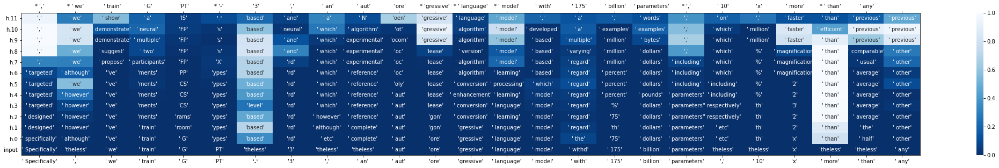

In [ ]:
from transformer_utils.logit_lens import plot_logit_lens

plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, probs=True)

as above, but here we're seeing the rank of the final predicted token.

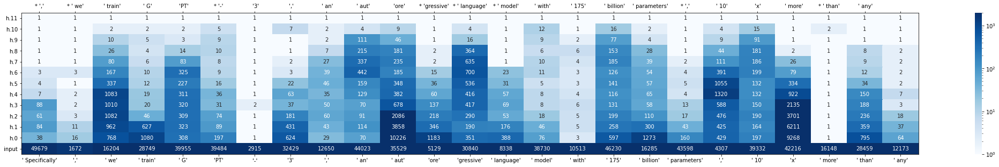

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, ranks=True)

K-L divergence w/r/t the final output distribution.

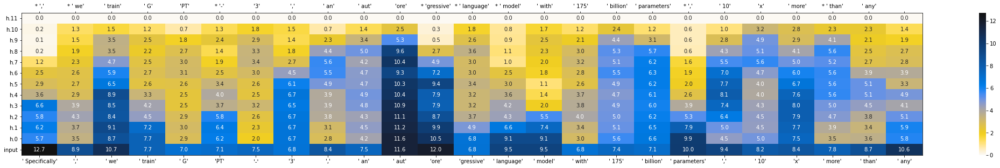

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, kl=True)

##### subblocks

a transformer block is actually 2 residual layers: an attn part followed by an mlp part.

here, we break them down:

- predictions after just the attn part of a block
- predictions after the full block (= after the mlp part too)

let's do ranks for this one

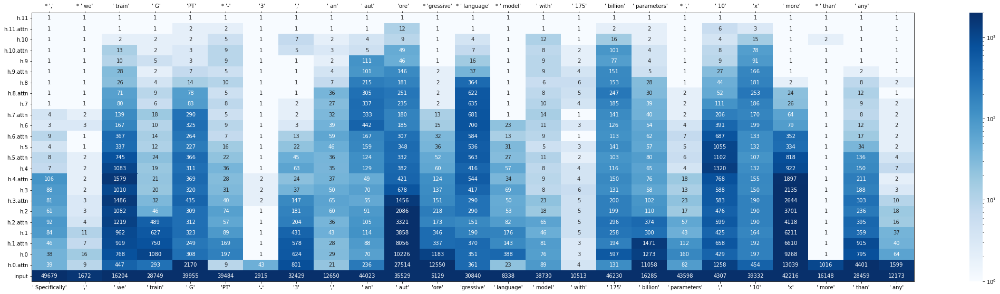

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, ranks=True, include_subblocks=True)

##### extending the decoder

in the original post, i "decoded" each layer with the "decoder" applied to the final block of the model:

- start with a layer's output
- apply a layer norm
  - in the post i used a "bare" layer norm with no shift/scale
  - here we'll use the model's `ln_f` (which is what the model actually uses when decoding from the last layer)
- multiply by the transposed embedding matrix

this effectively chooses a part of the model at the top, says "this is the decoder," and feeds other stuff through it.

----

what if we extend that subset?  for ex., we could view the last layer itself as the first step of the "decoder":

- start with a layer's output
- run the final layer
- run `ln_f`
- multiply by the transposed embedding matrix

in the next cell, i do that (plotting ranks, with subblocks).

it's not super exciting for gpt-2, but it will be for gpt-neo

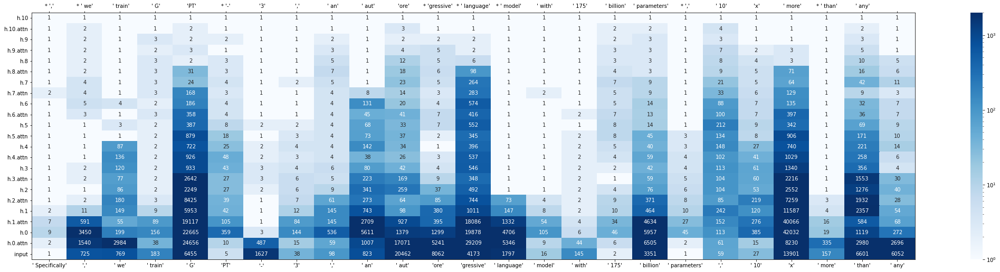

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, ranks=True, include_subblocks=True,
                decoder_layer_names=['h.11', 'final_layernorm', 'lm_head'])

In [ ]:
cleanup_model(model)

#### gpt-neo

In [ ]:
model = transformers.AutoModelForCausalLM.from_pretrained('EleutherAI/gpt-neo-125M')

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/lazy.py:175: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


##### gpt-neo: interpretation troubles?

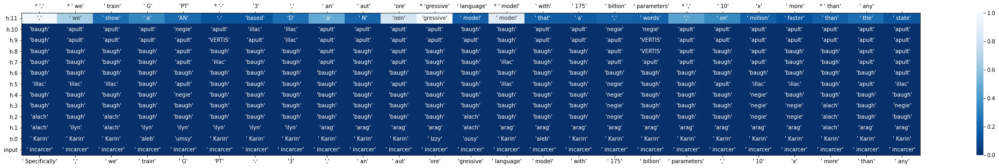

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, probs=True)

whoa, we can't see anything interpretable until the last layer!

that last layer sure is doing _something_ important.

let's break it down: what happens in that layer's attn, vs its mlp?

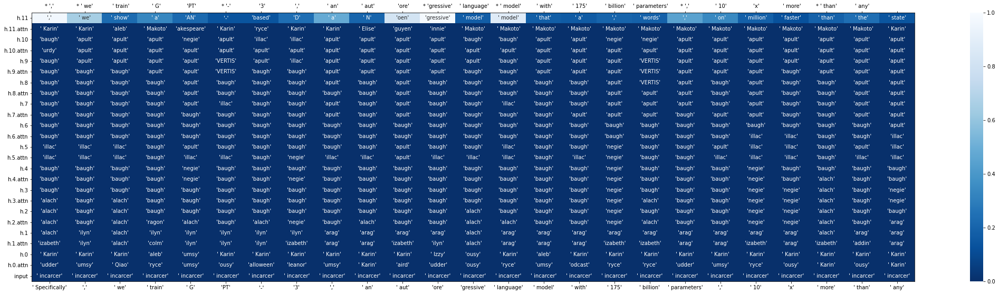

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, probs=True, include_subblocks=True)

okay, the attn part _changes_ what kind of nonsense we see, but only the mlp part turns it into sense.

so, let's incorporate the final mlp into our "decoder"!  if it can decode its weird-looking input, can it decode the earlier stuff too?

##### extending the decoder

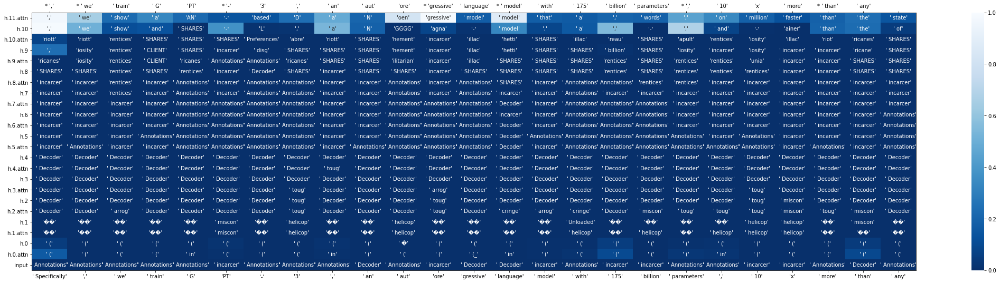

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, probs=True, include_subblocks=True,
                decoder_layer_names=['h.11.mlp', 'final_layernorm', 'lm_head'])

...nope.

apparently `h.11.attn` does some kind of work "preparing" the input of `h.11.mlp`, so the latter won't work without the former before it.

so, let's put the entire `h11` into the decoder.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 12428 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 12428 missing from current font.
  font.set_text(s, 0, flags=flags)


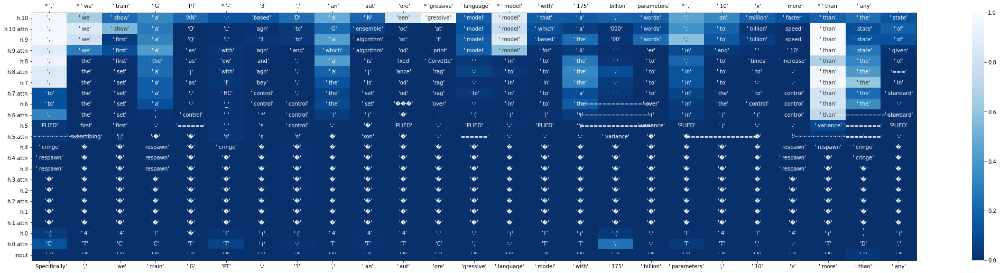

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, probs=True, include_subblocks=True,
                decoder_layer_names=['h.11', 'final_layernorm', 'lm_head'])

now we're getting somewhere!  we see interpretable stuff in... the last ~half of the model, at least

##### gpt-neo: comparing decoders

since that worked, let's plot it the other ways too -- ranks, KL

we'll compare to the original decoder that didn't work

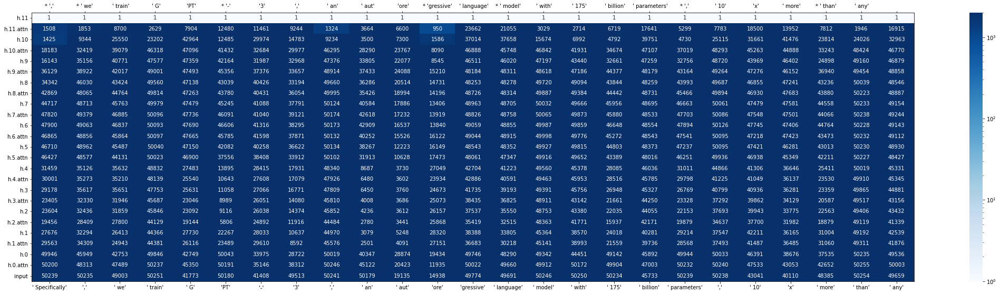

In [ ]:
# ranks, original (bad)
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, ranks=True, include_subblocks=True,
                decoder_layer_names=['final_layernorm', 'lm_head'])

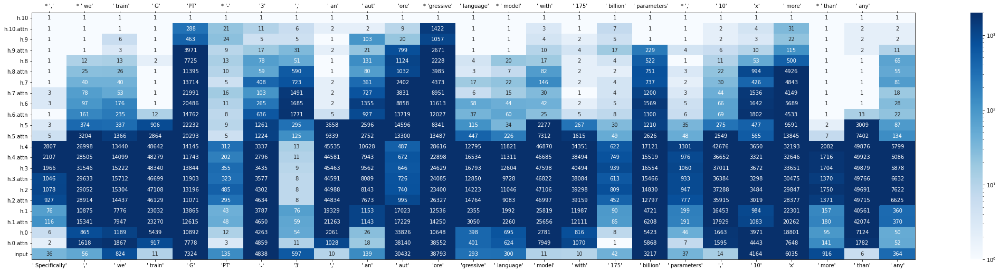

In [ ]:
# ranks, with `h11` in decoder
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, ranks=True, include_subblocks=True,
                decoder_layer_names=['h.11', 'final_layernorm', 'lm_head'])

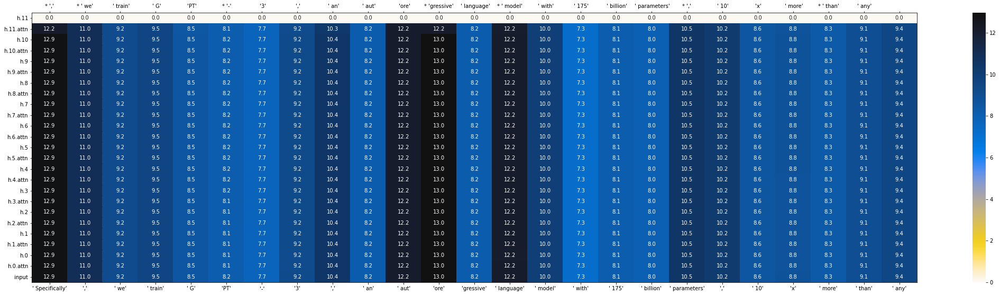

In [ ]:
# KL, original (bad)
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, kl=True, include_subblocks=True,
                decoder_layer_names=['final_layernorm', 'lm_head'])

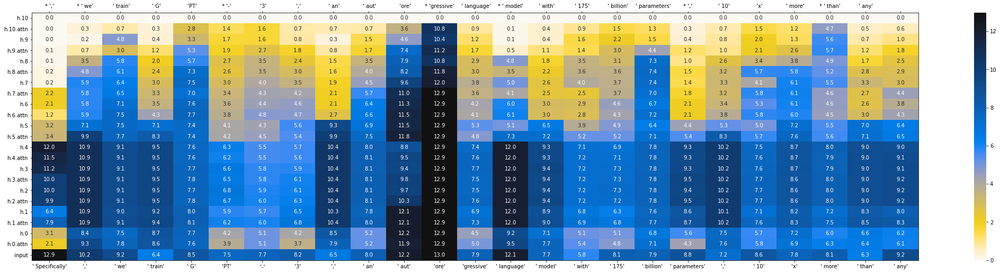

In [ ]:
# KL, with `h11` in decoder
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, kl=True, include_subblocks=True,
                decoder_layer_names=['h.11', 'final_layernorm', 'lm_head'])

In [ ]:
cleanup_model(model)

## ~1B param models

#### gpt2

In [ ]:
model = transformers.AutoModelForCausalLM.from_pretrained('gpt2-xl')

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/lazy.py:175: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


i'll assume you read through "small models" and do subblocks for everything below, since they're more fun :)

gpt2-xl has so many layer you'll need to scroll around a bit

##### probs, ranks, KL

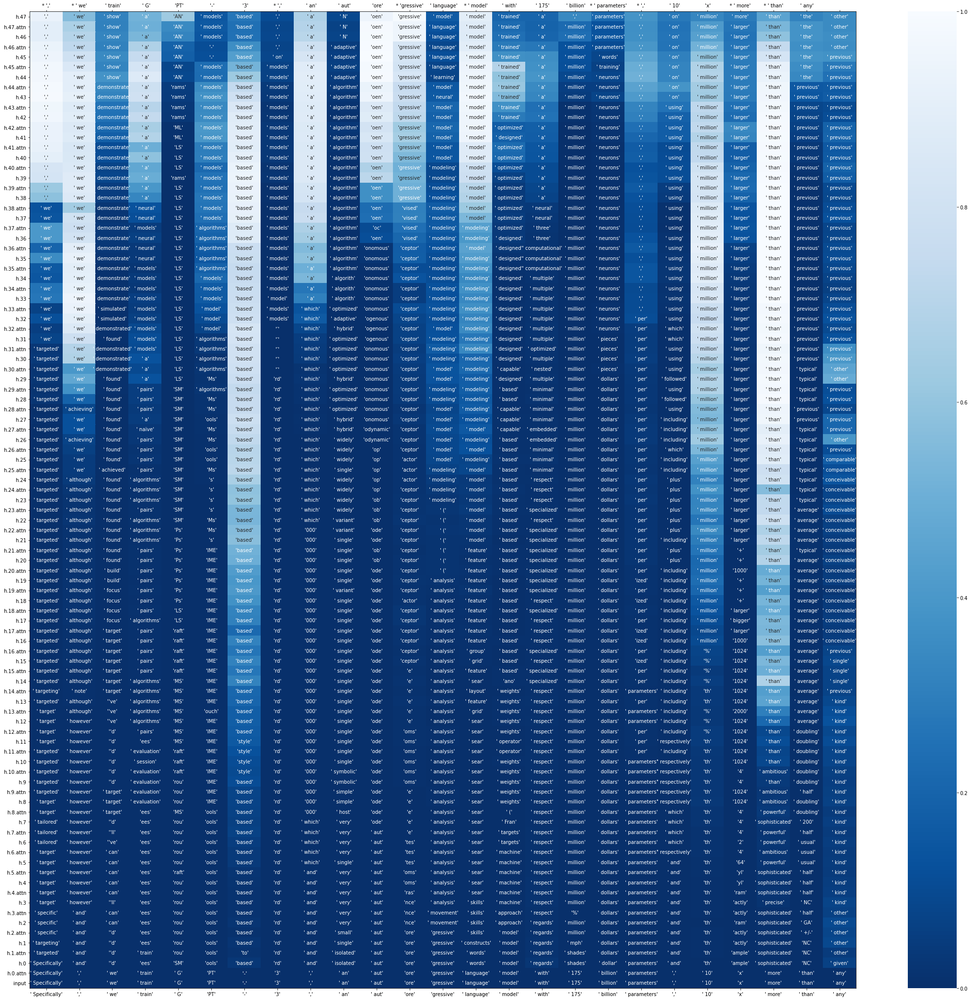

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, probs=True, include_subblocks=True)

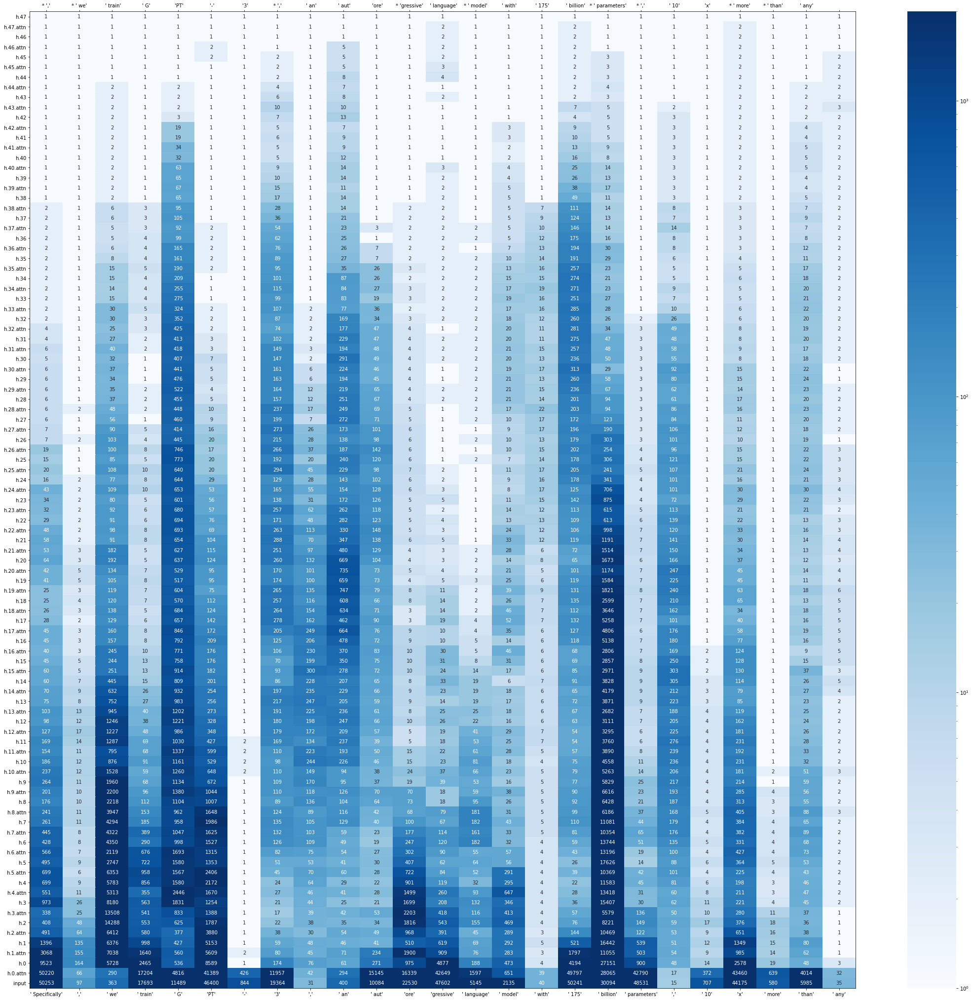

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, ranks=True, include_subblocks=True)

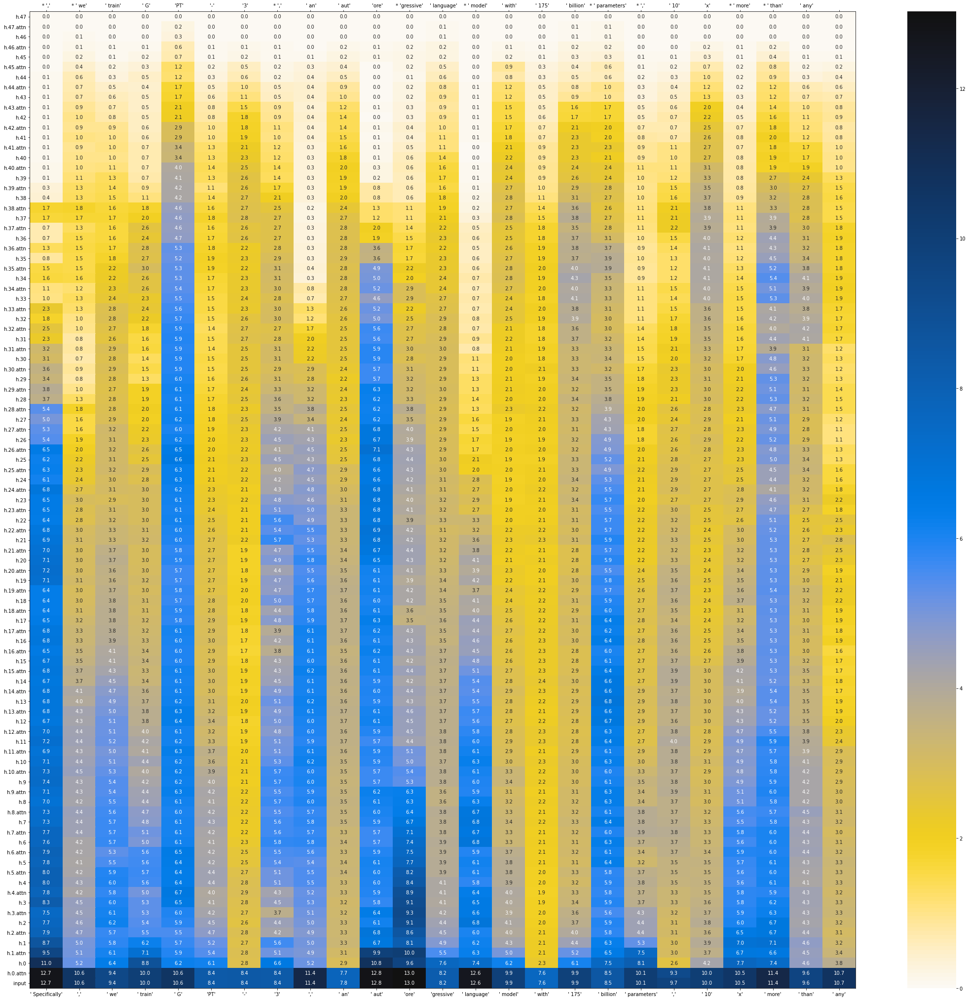

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, kl=True, include_subblocks=True)

##### extending the decoder

if we group the last layer in the decoder, the middle/lower layers look a lot closer to the output, even in gpt2

compare this plot to the previous one (!)

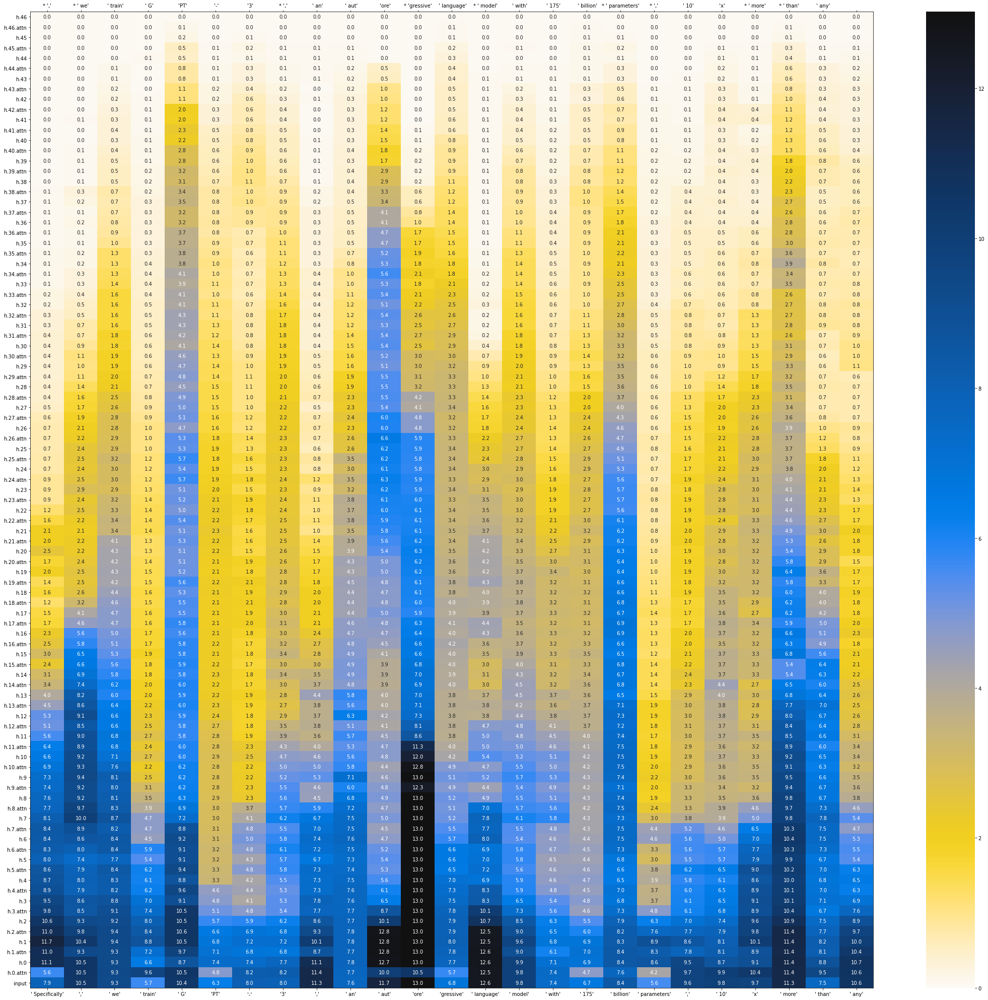

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, kl=True, include_subblocks=True,
                decoder_layer_names=['h.47', 'final_layernorm', 'lm_head'])

In [ ]:
cleanup_model(model)

#### gpt-neo

In [ ]:
model = transformers.AutoModelForCausalLM.from_pretrained('EleutherAI/gpt-neo-1.3B')

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/lazy.py:175: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


##### probs, ranks, KL

this bigger gpt-neo is less weird than the tiny one, though weird in the same way

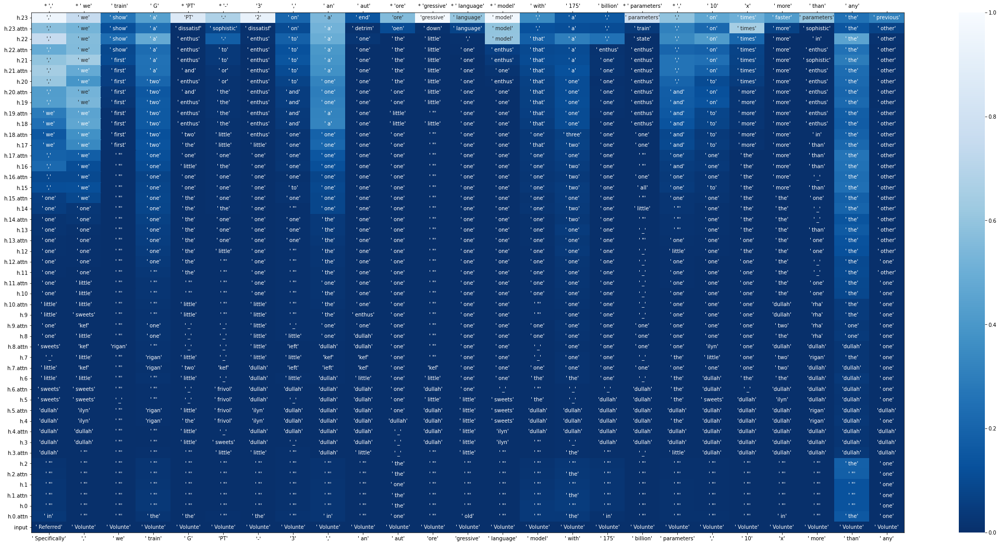

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, probs=True, include_subblocks=True)

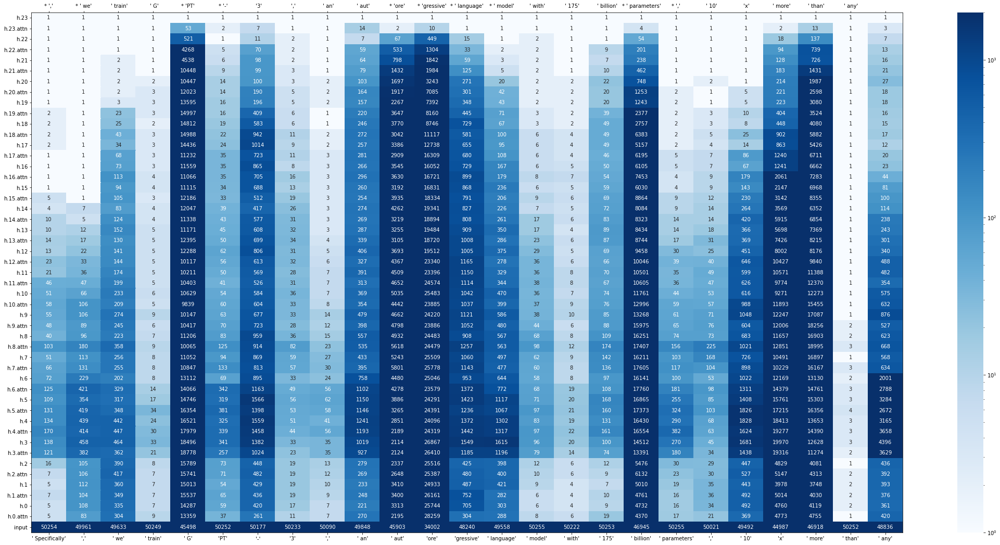

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, ranks=True, include_subblocks=True)

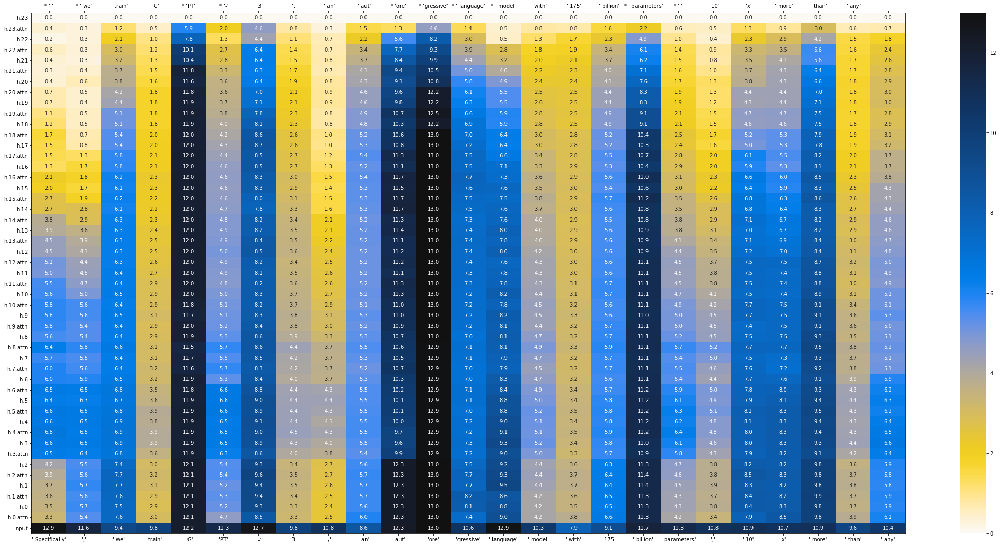

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, kl=True, include_subblocks=True)

##### extending the decoder

if we extend the decoder, the later layers look "better," and the earlier ones look "worse."  there's a really clear flip near the middle

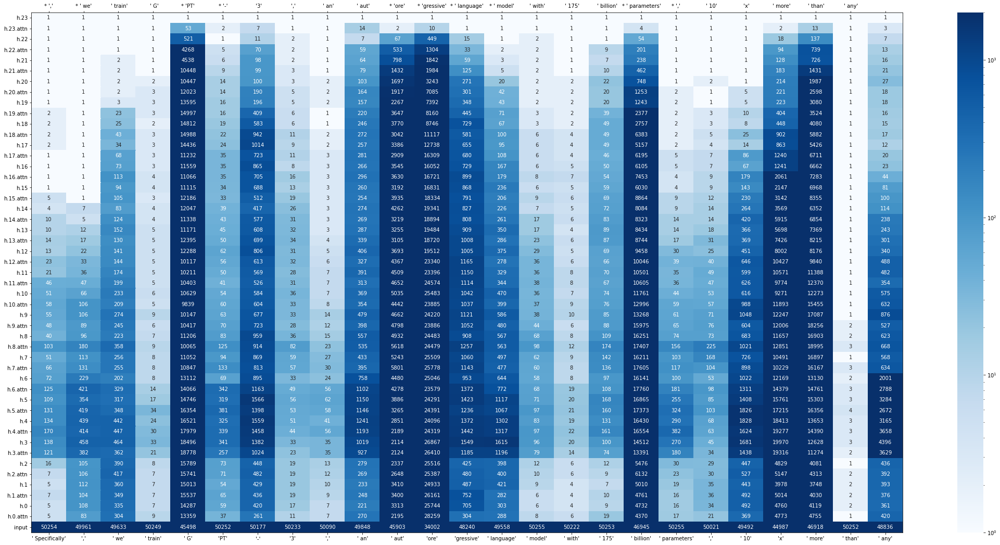

In [ ]:
# ranks, original decoder
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, ranks=True, include_subblocks=True,)

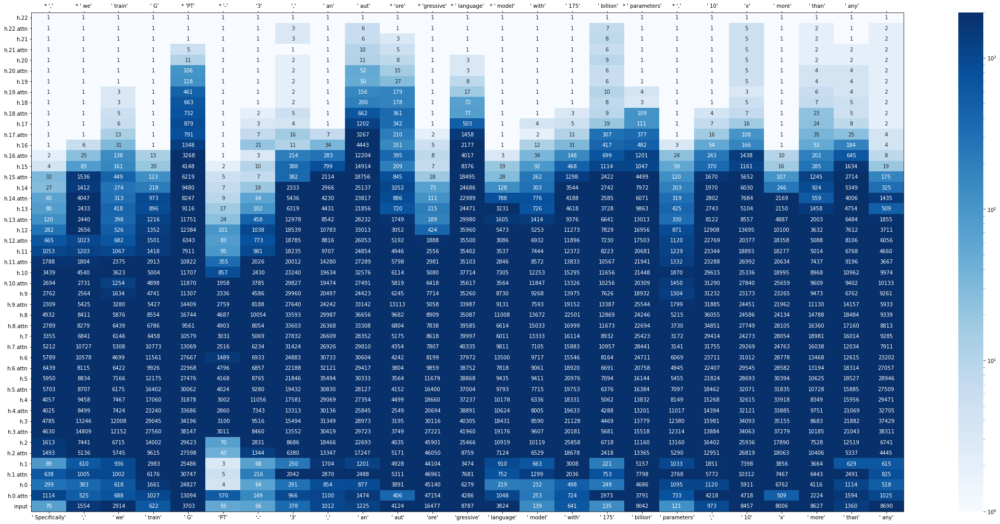

In [ ]:
# ranks, extended decoder
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, ranks=True, include_subblocks=True,
                decoder_layer_names=['h.23', 'final_layernorm', 'lm_head'])

putting just the final mlp in the decoder makes the "flip" go somewhat lower

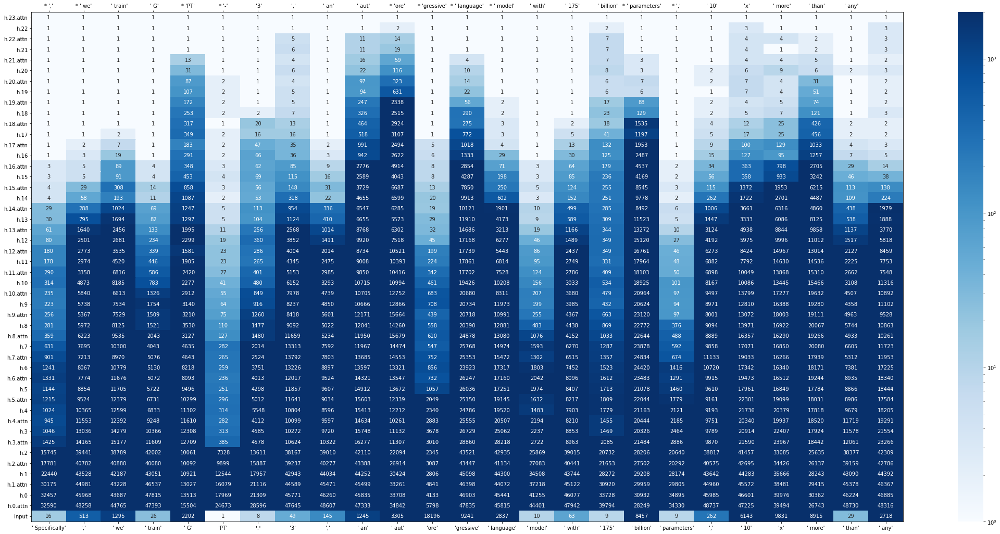

In [ ]:
# ranks, extended decoder w/ just the final mlp
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, ranks=True, include_subblocks=True,
                decoder_layer_names=['h.23.mlp', 'final_layernorm', 'lm_head'])

In [ ]:
cleanup_model(model)

#### CTRL

In [ ]:
# CTRL uses a different tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained("ctrl")

def text_to_input_ids(text):
    toks = tokenizer.encode(text)
    return torch.as_tensor(toks).view(1, -1).cuda()

input_ids = text_to_input_ids(gpt3_abstract)

input_ids = input_ids[:, :256]

Token indices sequence length is longer than the specified maximum sequence length for this model (315 > 256). Running this sequence through the model will result in indexing errors


In [ ]:
# TODO: figure out why this only works with `AutoModel`
model = transformers.AutoModel.from_pretrained("ctrl")

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/lazy.py:175: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


##### probs, ranks, KL

notes:

- don't have subblock code working with CTRL yet :(
- CTRL is already so nice-looking with the original decoder, i won't bother extending the decoder

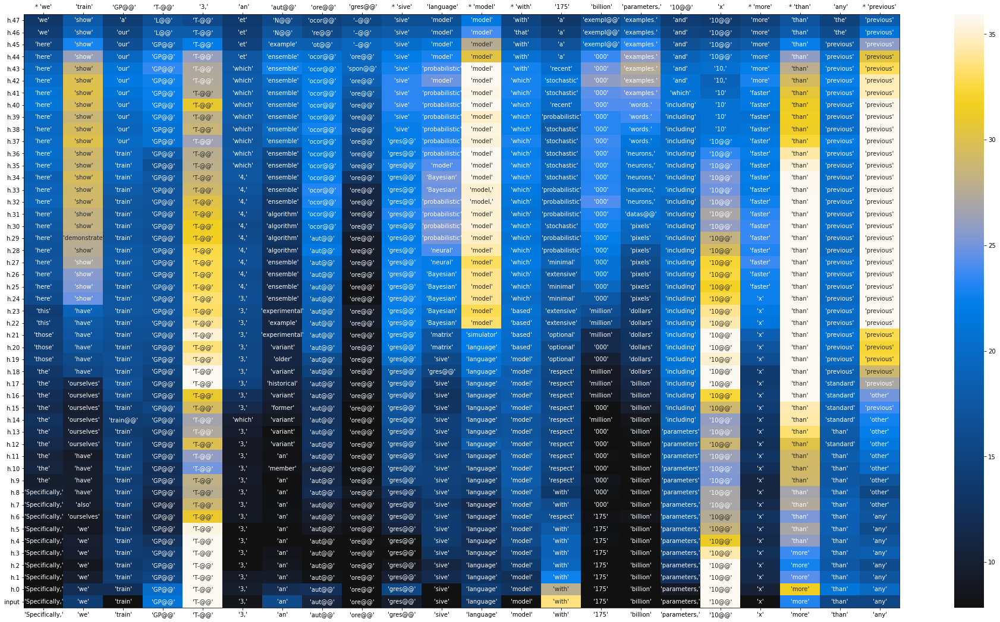

In [ ]:
from transformer_utils.logit_lens import plot_logit_lens
plot_logit_lens(model, tokenizer, input_ids, start_ix=114, end_ix=136, probs=False, include_subblocks=False)

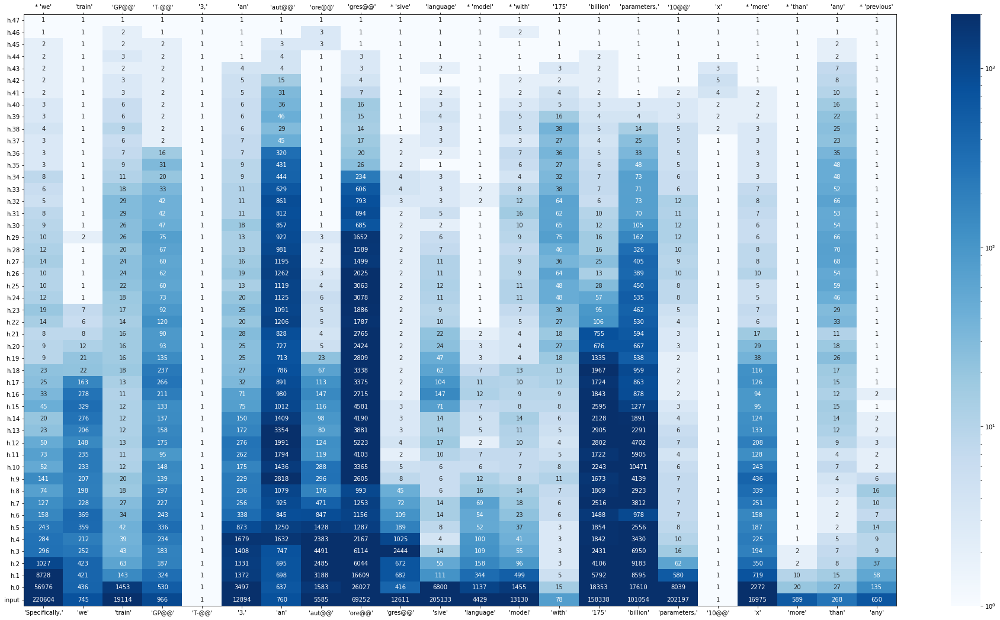

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=114, end_ix=136, ranks=True, include_subblocks=False)

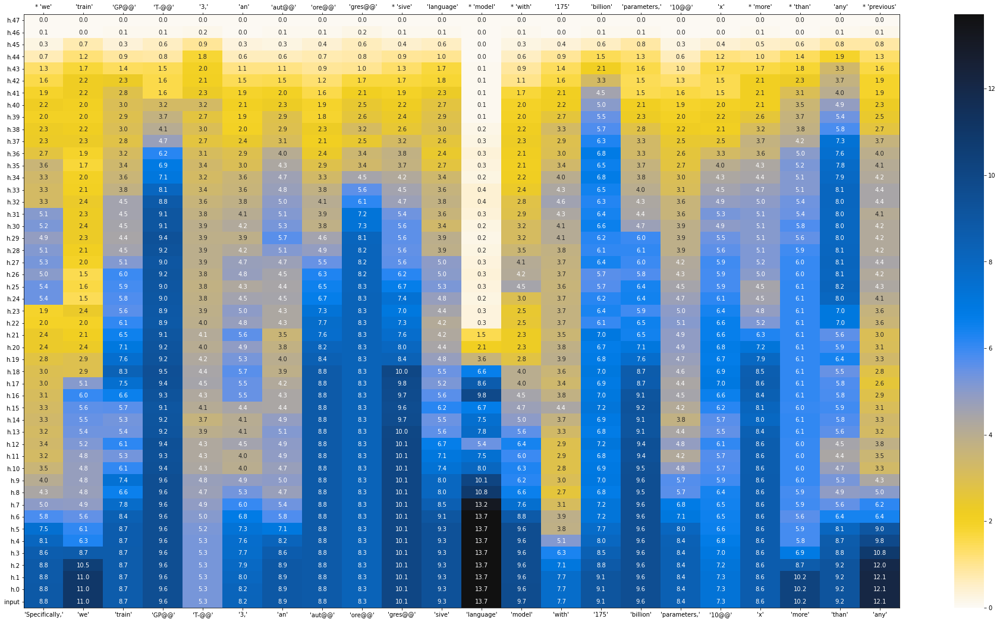

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=114, end_ix=136, kl=True, include_subblocks=False)

In [ ]:
cleanup_model(model)

## ~3B param models

#### gpt-neo

this model is big so you may need to restart and do some imports over again for it to work

In [ ]:
model = transformers.AutoModelForCausalLM.from_pretrained('EleutherAI/gpt-neo-2.7B')

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/lazy.py:175: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


In [ ]:
# back to the gpt tokenizer

tokenizer = transformers.AutoTokenizer.from_pretrained("gpt2")

def text_to_input_ids(text):
    toks = tokenizer.encode(text)
    return torch.as_tensor(toks).view(1, -1).cuda()

input_ids = text_to_input_ids(gpt3_abstract)

input_ids = input_ids[:, :160]

##### probs, ranks, KL

as we'd expect, only the late layers look like the output.

it's "worse" here than 1.3B, maybe?

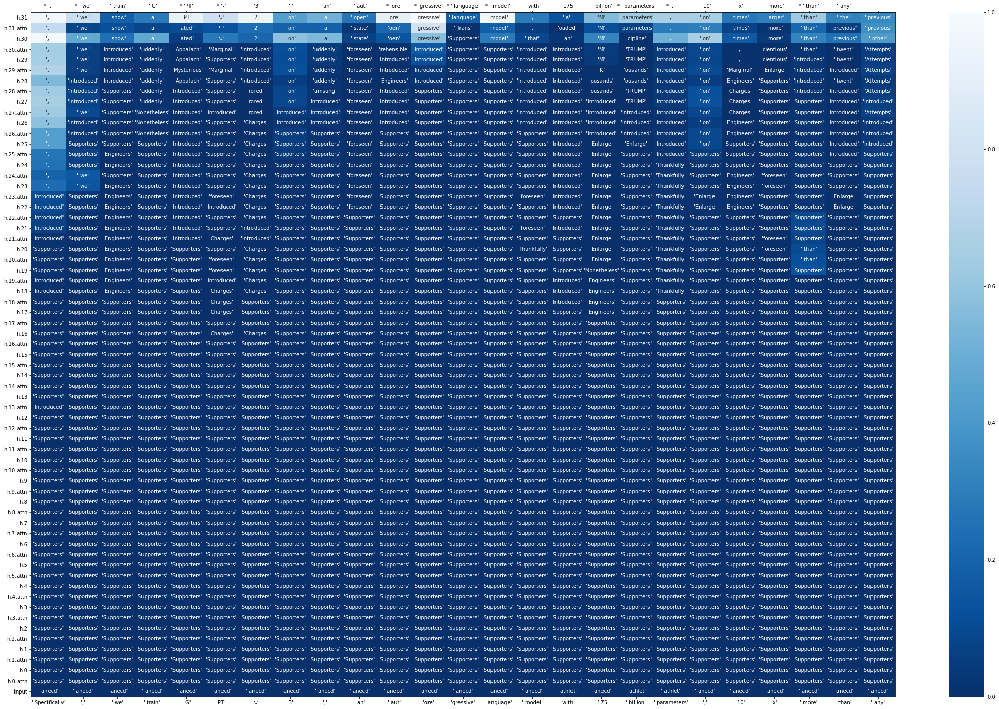

In [ ]:
from transformer_utils.logit_lens import plot_logit_lens
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, probs=True, include_subblocks=True)

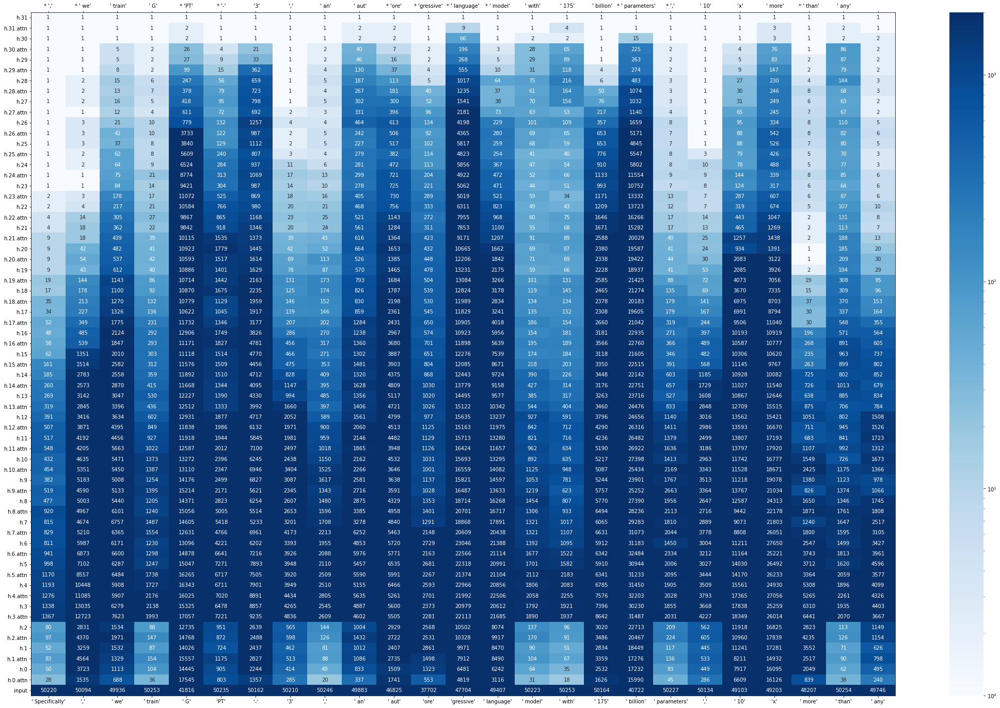

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, ranks=True, include_subblocks=True)

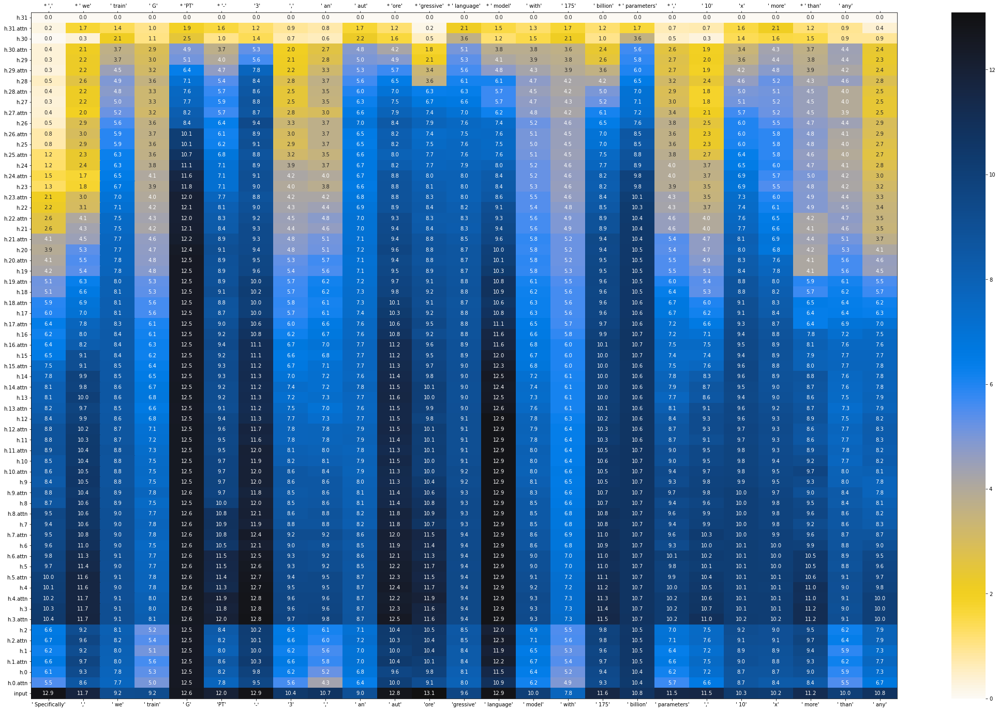

In [ ]:
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, kl=True, include_subblocks=True)

##### extending the decoder

adding the last layer to the decoder dramatically "improves" mid-to-late layers in this one

(amusingly, "PT" following " G" still only emerges in late layers.  note that this is the first appearance of "GPT" in the abstract)

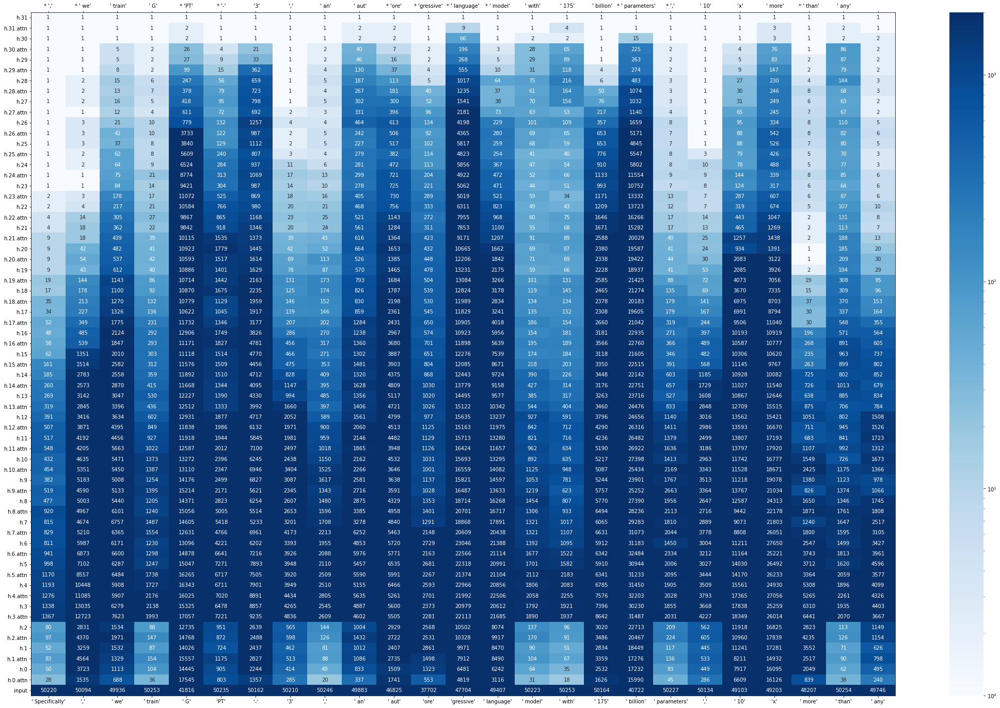

In [ ]:
# ranks, original decoder
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, ranks=True, include_subblocks=True,)

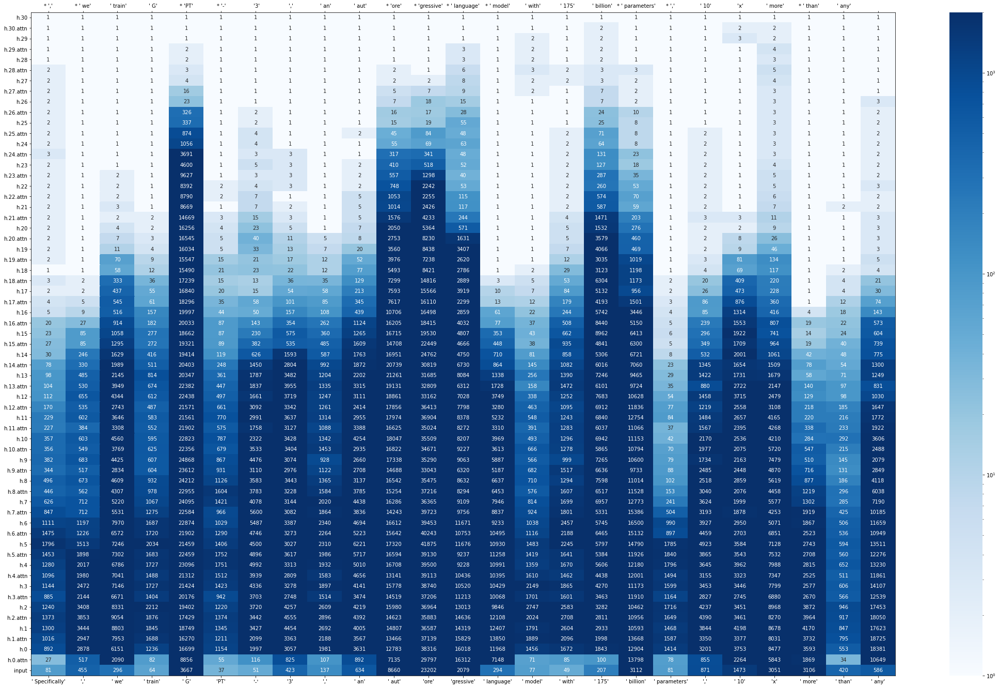

In [ ]:
# ranks, last layer in decoder
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, ranks=True, include_subblocks=True,
                decoder_layer_names=['h.31', 'final_layernorm', 'lm_head'])

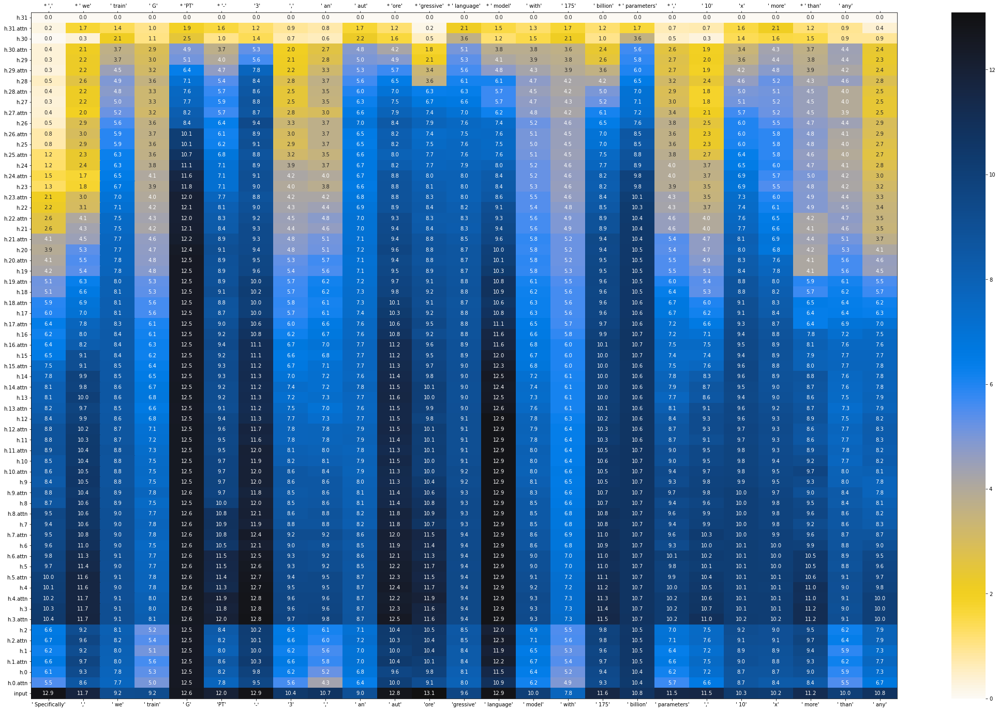

In [ ]:
# KL, original decoder
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, kl=True, include_subblocks=True,)

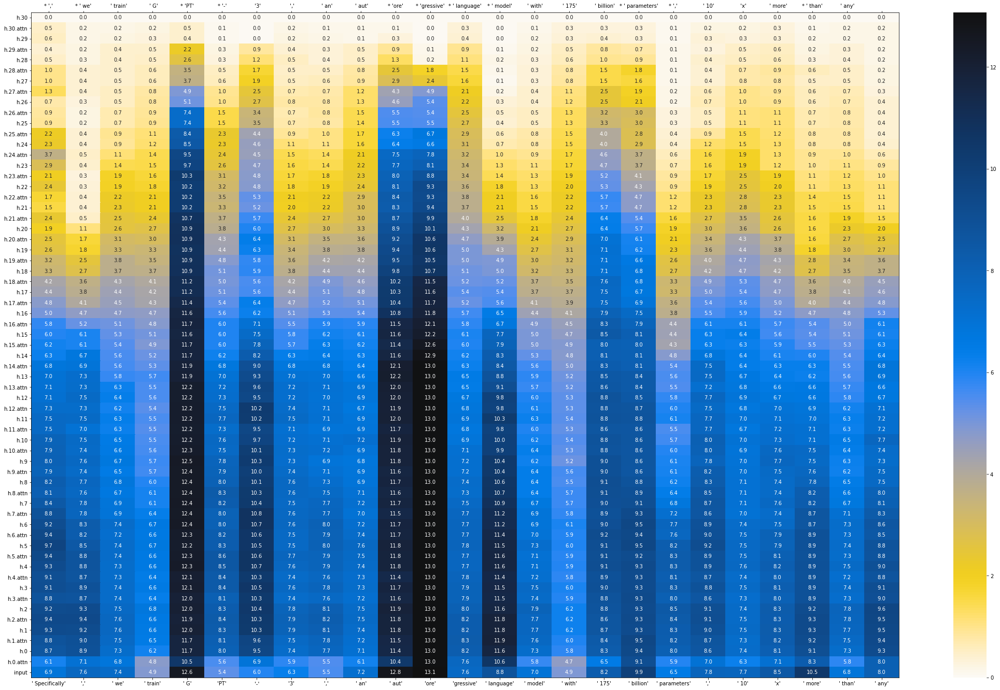

In [ ]:
# KL, last layer in decoder
plot_logit_lens(model, tokenizer, input_ids, start_ix=135, end_ix=160, kl=True, include_subblocks=True,
                decoder_layer_names=['h.31', 'final_layernorm', 'lm_head'])

In [ ]:
cleanup_model(model)